In [1]:
import scanpy as sc
import anndata as ad
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
#import celltypist
import time
import scvi
import seaborn as sns
import torch
from rich import print
#from scib_metrics.benchmark import Benchmarker

/home/users/isakova/.local/lib/python3.12/site-packages/leidenalg/VertexPartition.py:388: SyntaxWarning: invalid escape sequence '\m'
  """ Implements modularity. This quality function is well-defined only for positive edge weights.
/home/users/isakova/.local/lib/python3.12/site-packages/leidenalg/VertexPartition.py:761: SyntaxWarning: invalid escape sequence '\m'
  """ Implements Reichardt and Bornholdt's Potts model with a configuration null model.
/home/users/isakova/.local/lib/python3.12/site-packages/leidenalg/Optimiser.py:7: SyntaxWarning: invalid escape sequence '\g'
  """ Class for doing community detection using the Leiden algorithm.
/home/users/isakova/.local/lib/python3.12/site-packages/leidenalg/Optimiser.py:305: SyntaxWarning: invalid escape sequence '\s'
  """ Optimise the given partitions simultaneously.
/home/users/isakova/.local/lib/python3.12/site-packages/ml_collections/config_dict/config_dict.py:163: SyntaxWarning: invalid escape sequence '\['
  index_match = re.mat

In [2]:
scvi.settings.seed = 0
print("Last run with scvi-tools version:", scvi.__version__)

[rank: 0] Seed set to 0


Last run with scvi-tools version: 1.2.2.post2

In [3]:
sc.set_figure_params(figsize=(6, 6), frameon=False)
sns.set_theme()
torch.set_float32_matmul_precision("high")

%config InlineBackend.print_figure_kwargs={"facecolor": "w"}
%config InlineBackend.figure_format="retina"

In [ ]:

# File paths
file_paths = {
    'GW19': 'F5.Brain.part1/Brain_GW19_processed_annotated.h5ad',
    '9MO': 'F5.Brain.part1/Brain_9MO_processed_annotated.h5ad',
    '8YO': 'F5.Brain.part1/Brain_8YO_processed_annotated.h5ad',
    '16YO': 'F5.Brain.part1/Brain_16YO_processed_annotated.h5ad'
}

# Load, process, and store datasets
adata_list = []
for key, path in file_paths.items():
    # Read the data
    adata = sc.read_h5ad(path)
    
    # Modify `X` to use counts
    if 'counts' in adata.layers:
        adata.X = adata.layers['counts']
    
    # Clear unnecessary fields
    adata.obsp.clear()
    adata.varm.clear()
    adata.uns.clear()
    adata.obsm.clear()
    
    # Ensure var_names are strings and make them unique
    adata.var_names = adata.var_names.astype(str)
    adata.var_names_make_unique()
    
    # Append processed data
    adata_list.append(adata)

# Concatenate datasets
adata = adata_list[0].concatenate(
    *adata_list[1:], 
    batch_key='brain', 
    batch_categories=list(file_paths.keys()),
    join='outer'
)

# Save the concatenated dataset (optional)
adata.write('/oak/stanford/projects/kibr/Alina/Analysis/F5.Brain.part1/TSB_annotated_raw_v2.h5ad')


In [ ]:
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)
adata.write('/oak/stanford/projects/kibr/Alina/Analysis/F5.Brain.part1/TSB_annotated_log1p_v2.h5ad')

In [4]:
adata=sc.read_h5ad('/oak/stanford/projects/kibr/Alina/Analysis/F5.Brain.part1/TSB_annotated_log1p_v2.h5ad')

import gc
# Step 1: Subset to protein-coding genes with non-NA gene names
adata_protein_coding = adata[:, (adata.var["biotype"] == "protein_coding")]

# Step 2: Identify highly variable genes (HVGs) among protein-coding genes
sc.pp.highly_variable_genes(
    adata_protein_coding,
    n_top_genes=3000,
    subset=False,  # Do not subset immediately
    layer="counts",
    flavor="seurat_v3",
    batch_key="batch",  # Consider batch information
)

# Step 3: Transfer HVG labels back to the full dataset
adata.var["highly_variable"] = False  # Initialize all as False
adata.var.loc[adata_protein_coding.var_names[adata_protein_coding.var["highly_variable"]], "highly_variable"] = True

# Step 4: Subset the original dataset to only include highly variable genes
#adata = adata[:, adata.var["highly_variable"]]

# Step 5: Cleanup the intermediate object to save memory
del adata_protein_coding
gc.collect()


/home/users/isakova/.local/lib/python3.12/site-packages/scanpy/preprocessing/_highly_variable_genes.py:172: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns["hvg"] = {"flavor": flavor}


40

In [5]:
# Step 2: Create a new AnnData containing only HVGs (for training)
adata_hvg = adata[:, adata.var.highly_variable].copy()


In [6]:
adata = adata.copy()

In [7]:
scvi.model.SCVI.setup_anndata(adata_hvg, layer="counts", batch_key="batch")
model = scvi.model.SCVI(adata_hvg, n_layers=2, n_latent=30, gene_likelihood="nb")

In [8]:
model.train()

/home/users/isakova/.local/lib/python3.12/site-packages/lightning/fabric/plugins/environments/slurm.py:204: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python3 /home/users/isakova/.local/lib/python3.12/site-pack ...
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/home/users/isakova/.local/lib/python3.12/site-packages/lightning/fabric/plugins/environments/slurm.py:204: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python3 /home/users/isakova/.local/lib/python3.12/site-pack ...
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
/home/users/isakova/.local/lib/python3.12/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:424: The 'train_dataloader' does not have m

Epoch 1/27:   0%|          | 0/27 [00:00<?, ?it/s]

Epoch 27/27: 100%|██████████| 27/27 [06:35<00:00, 14.68s/it, v_num=1, train_loss_step=1.51e+3, train_loss_epoch=1.28e+3]

`Trainer.fit` stopped: `max_epochs=27` reached.


Epoch 27/27: 100%|██████████| 27/27 [06:35<00:00, 14.65s/it, v_num=1, train_loss_step=1.51e+3, train_loss_epoch=1.28e+3]


In [9]:
SCVI_LATENT_KEY = "X_scVI"
adata.obsm[SCVI_LATENT_KEY] = model.get_latent_representation()

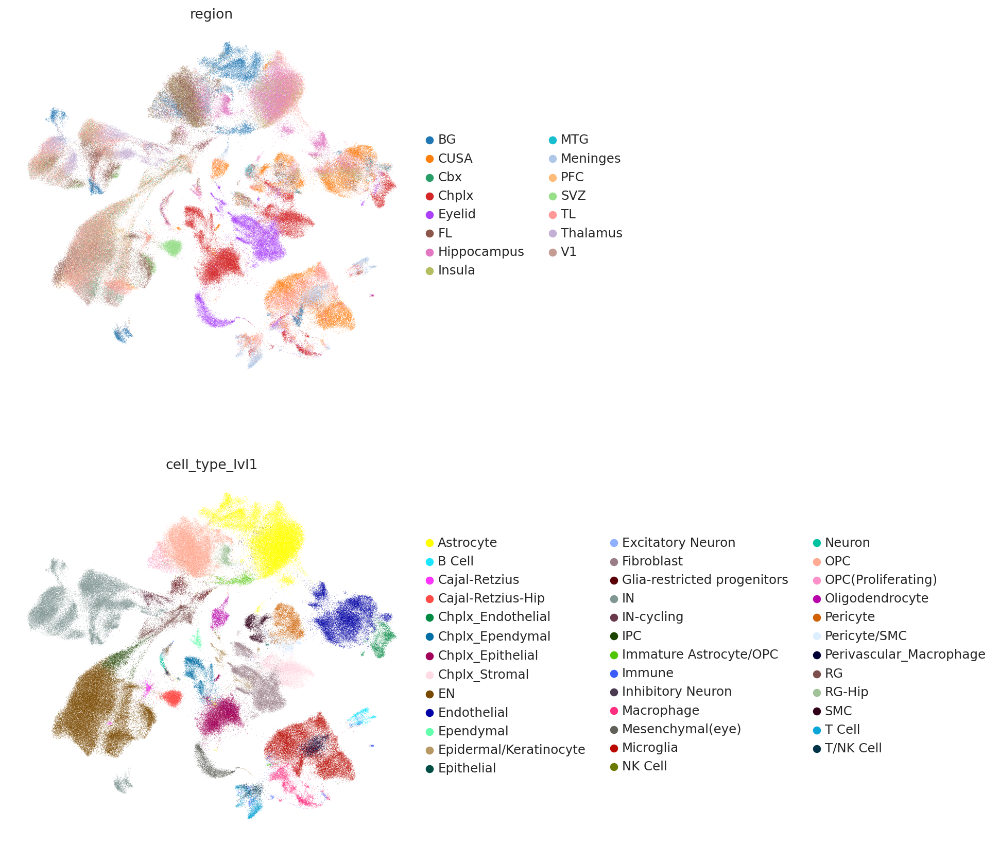

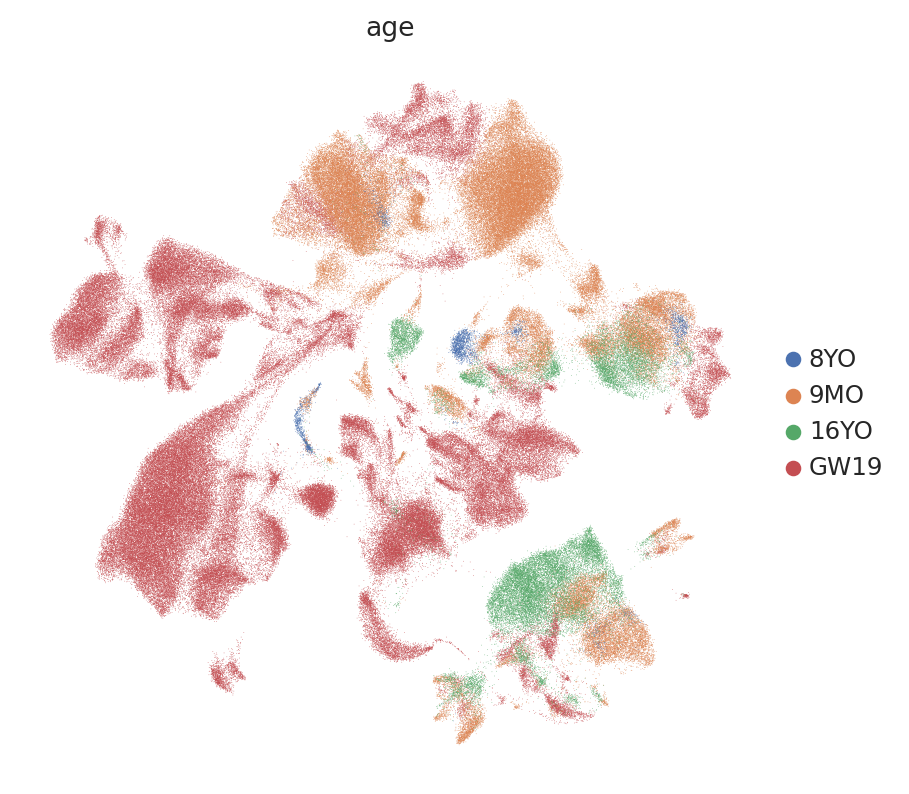

In [10]:
sc.pp.neighbors(adata, use_rep=SCVI_LATENT_KEY)
sc.tl.umap(adata)
sc.pl.umap(
    adata,
    color=["region", "cell_type_lvl1"],
    frameon=False,
    ncols=1,
)
sc.pl.umap(
    adata,
    color=["age"],
    frameon=False,
    ncols=1,
)

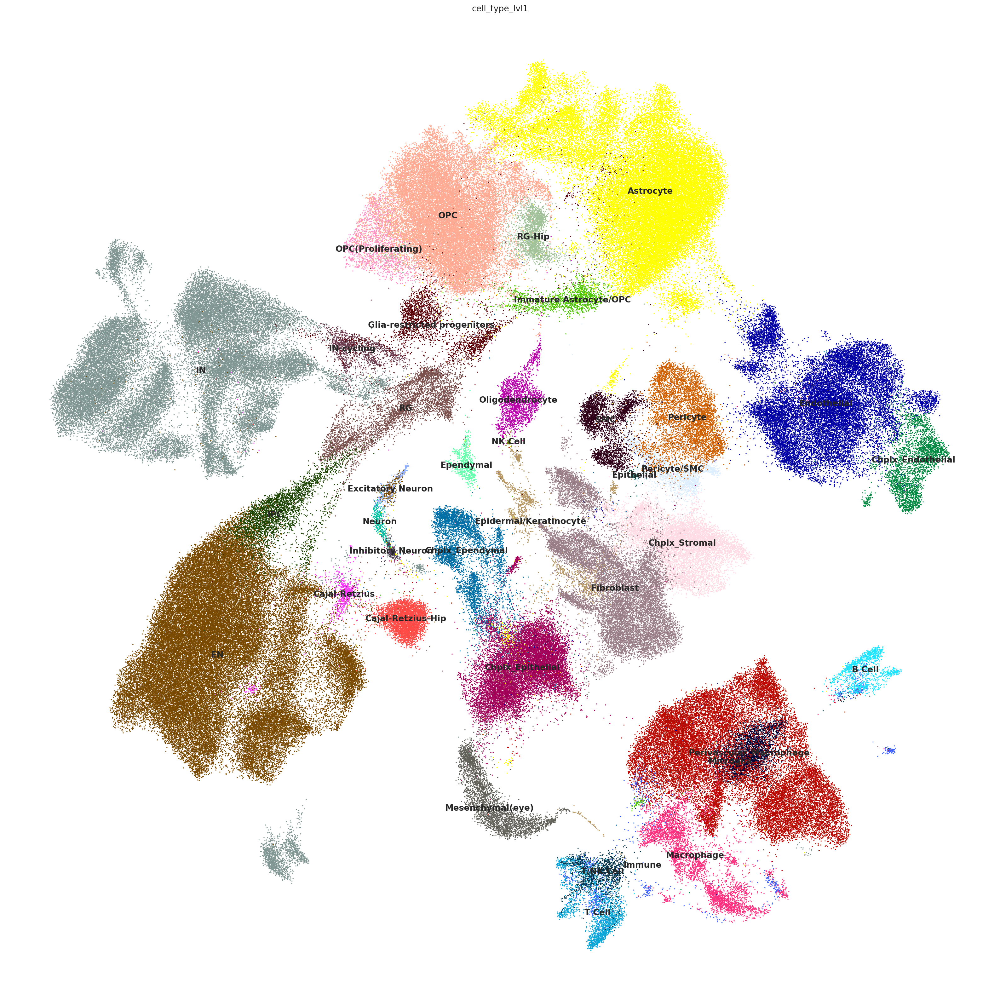

In [11]:
# Plot the UMAP and get the figure
fig = sc.pl.umap(
    adata,
    color=["cell_type_lvl1"],
    frameon=False,
    size=10,
    legend_loc="on data",
    return_fig=True
)

# Adjust figure size
fig.set_size_inches(20, 20)  # Set width and height in inches
fig.tight_layout()  # Adjust layout
fig.show()


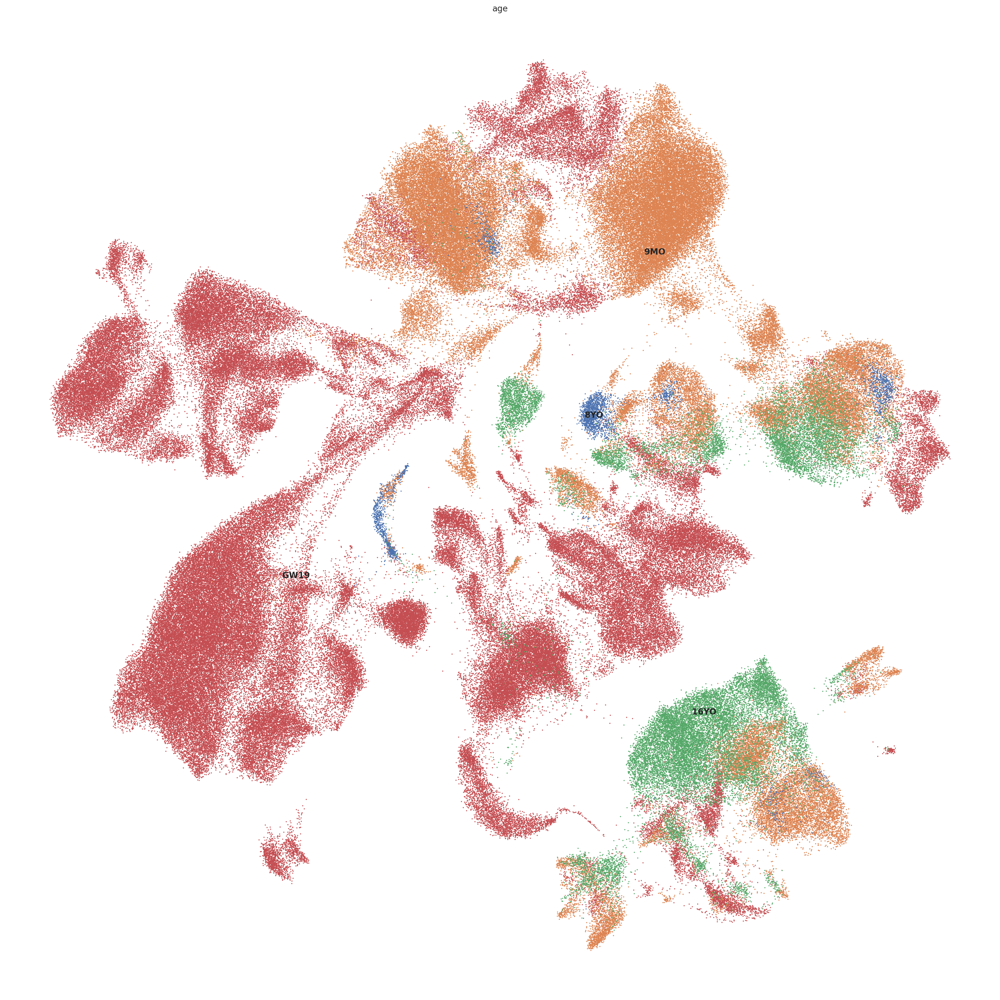

In [12]:
# Plot the UMAP and get the figure
fig = sc.pl.umap(
    adata,
    color=["age"],
    frameon=False,
    size=10,
    legend_loc="on data",
    return_fig=True
)

# Adjust figure size
fig.set_size_inches(20, 20)  # Set width and height in inches
fig.tight_layout()  # Adjust layout
fig.show()


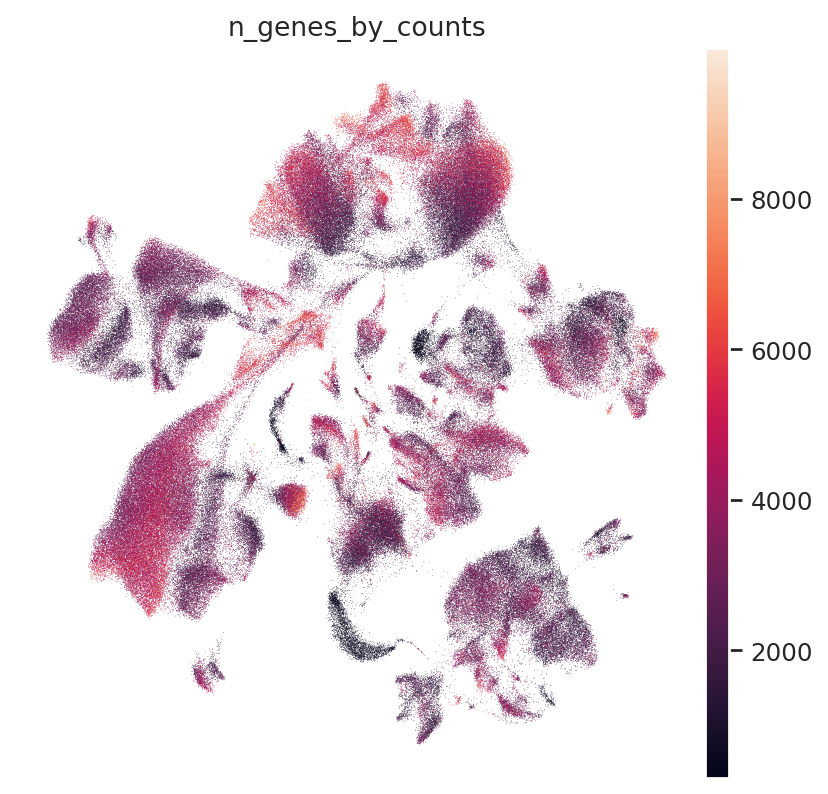

In [13]:
sc.pl.umap(
    adata,
    color=["n_genes_by_counts"],
    frameon=False,
    ncols=1,
)

In [14]:
# Save the trained model
output_path = "scvi_model_full/"
model.save(output_path, overwrite=True)

In [15]:
adata.write('TSB_annotated_log1p_scvi_full.h5ad')